In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing
import random
import os
import random as rn
import cv2
import matplotlib.pyplot as plt
import shutil

In [3]:
os.chdir('/content/gdrive/MyDrive/Self_checkout')

# Prepare Training Data.

In [4]:
!pip install boxx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.7/87.7 KB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.1/282.1 KB 13.1 MB/s eta 0:00:00
  Created wheel for boxx: filename=boxx-0.10.8-py3-none-any.whl size=93984 sha256=24fb42da76d9a136cc7e380cb50c7f0fe5f677c372e279976bfef0c1ea55e98d
  Stored in directory: /root/.cache/pip/wheels/38/bf/16/e939affccfa3e1e2c13cfb7c5a5eb41ccad51868413fdc0456
Successfully built boxx


# **Exploratory Data Analysis for Train Datasets**

In [5]:
import boxx
data = boxx.loadjson('train.json')


# Visualization struct of instances_train2019.json
# These annotation files has similar struct as COCO Object Detection Dataset
boxx.tree(data, deep=1)

└── /: dict  6
    ├── info: dict  7
    ├── licenses: list  1
    ├── categories: list  200
    ├── __raw_Chinese_name_df: list  200
    ├── images: list  53739
    └── annotations: list  53739


# Data Info

In [6]:
print(type(data))
data.keys()

<class 'dict'>


dict_keys(['info', 'licenses', 'categories', '__raw_Chinese_name_df', 'images', 'annotations'])

In [7]:
data['info']

{'description': 'RPC: A Large-Scale Retail Product Checkout Dataset',
 'url': 'http://RPC-Dataset.github.io',
 'version': '1.1',
 'year': 2019,
 'contributor': 'Megvii Research Nanjing',
 'date_created': '2019/01/09',
 'dataset_license': [{'url': 'http://creativecommons.org/licenses/by-nc-sa/2.0/',
   'id': 1,
   'name': 'Attribution-NonCommercial-ShareAlike License'}]}

## Data Categories

In [8]:
categories_df = pd.DataFrame(data['categories'])
categories_df=categories_df.rename(columns={'id': 'category_id'})
#categories_df = categories_df[["supercategory", "name"]]
print('Type of categories:- ',categories_df.shape[0])
categories_df.head()

Type of categories:-  200


,supercategory,category_id,name
0,puffed_food,1,1_puffed_food
1,puffed_food,2,2_puffed_food
2,puffed_food,3,3_puffed_food
3,puffed_food,4,4_puffed_food
4,puffed_food,5,5_puffed_food


In [9]:
categories_grp = categories_df.groupby('supercategory', as_index=False)
categories_grp.groups

{'alcohol': [78, 79, 87, 88, 89, 90, 91, 92, 93, 94, 95], 'candy': [141, 142, 143, 144, 145, 146, 147, 148, 149, 150], 'canned_food': [107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120], 'chocolate': [121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132], 'dessert': [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69], 'dried_food': [21, 22, 23, 24, 25, 26, 27, 28, 29], 'dried_fruit': [12, 13, 14, 15, 16, 17, 18, 19, 20], 'drink': [70, 71, 72, 73, 74, 75, 76, 77, 80, 81, 82, 83, 84, 85, 86], 'gum': [133, 134, 135, 136, 137, 138, 139, 140], 'instant_drink': [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40], 'instant_noodles': [41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52], 'milk': [96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106], 'personal_hygiene': [163, 164, 165, 166, 167, 168, 169, 170, 171, 172], 'puffed_food': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], 'seasoner': [151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162], 'stationery': [193,

## Data Raw Chinese.

In [10]:
raw_Chinese_name_df = pd.DataFrame(data['__raw_Chinese_name_df'])
raw_Chinese_name_df=raw_Chinese_name_df.rename(columns={'name': 'product_description','clas':'product_class'})
raw_Chinese_name_df.head()

,sku_name,category_id,sku_class,code,shelf,num,product_description,product_class,known,ind
0,1_puffed_food,1,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,2_puffed_food,2,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,3_puffed_food,3,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,4_puffed_food,4,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,5_puffed_food,5,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [11]:
raw_Chinese_name_df.head()

,sku_name,category_id,sku_class,code,shelf,num,product_description,product_class,known,ind
0,1_puffed_food,1,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,2_puffed_food,2,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,3_puffed_food,3,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,4_puffed_food,4,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,5_puffed_food,5,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [12]:
raw_Chinese_name_df.groupby(['sku_class', 'product_class'], as_index=False).size()

,sku_class,product_class,size
0,alcohol,酒,11
1,candy,糖果,10
2,canned_food,罐头,14
3,chocolate,巧克力,12
4,dessert,饼干点心,17
5,dried_food,干货,9
6,dried_fruit,果仁果脯,9
7,drink,饮料,15
8,gum,口香糖,8
9,instant_drink,冲调,11


In [13]:
pd.set_option("display.max_rows", None)
raw_Chinese_name_df.groupby(['sku_class', 'product_class', 'sku_name']).first()

category_id  \
sku_class        product_class sku_name                            
alcohol          酒             79_alcohol                     79   
                               80_alcohol                     80   
                               88_alcohol                     88   
                               89_alcohol                     89   
                               90_alcohol                     90   
                               91_alcohol                     91   
                               92_alcohol                     92   
                               93_alcohol                     93   
                               94_alcohol                     94   
                               95_alcohol                     95   
                               96_alcohol                     96   
candy            糖果            142_candy                     142   
                               143_candy                     143   
                               144_candy                     144   
                               145_candy                     145   
                               146_candy                     146   
                               147_candy                     147   
                               148_candy                     148   
                               149_candy                     149   
                               150_candy                     150   
                               151_candy                     151   
canned_food      罐头            108_canned_food               108   
                               109_canned_food               109   
                               110_canned_food               110   
                               111_canned_food               111   
                               112_canned_food               112   
                               113_canned_food               113   
                               114_canned_food               114   
                               115_canned_food               115   
                               116_canned_food               116   
                               117_canned_food               117   
                               118_canned_food               118   
                               119_canned_food               119   
                               120_canned_food               120   
                               121_canned_food               121   
chocolate        巧克力           122_chocolate                 122   
                               123_chocolate                 123   
                               124_chocolate                 124   
                               125_chocolate                 125   
                               126_chocolate                 126   
                               127_chocolate                 127   
                               128_chocolate                 128   
                               129_chocolate                 129   
                               130_chocolate                 130   
                               131_chocolate                 131   
                               132_chocolate                 132   
                               133_chocolate                 133   
dessert          饼干点心          54_dessert                     54   
                               55_dessert                     55   
                               56_dessert                     56   
                               57_dessert                     57   
                               58_dessert                     58   
                               59_dessert                     59   
                               60_dessert                     60   
                               61_dessert                     61   
                               62_dessert                     62   
                               63_dessert                     63   
                               64_dessert

In [14]:
raw_Chinese_name_df[raw_Chinese_name_df['sku_class'] == 'drink']

,sku_name,category_id,sku_class,code,shelf,num,product_description,product_class,known,ind
70,71_drink,71,drink,6921168509256,3,5,农夫山泉矿泉水550ml,饮料,True,70
71,72_drink,72,drink,6901285991219,3,5,怡宝矿泉水555ml,饮料,True,71
72,73_drink,73,drink,6928804010114,3,5,可口可乐零度500ml,饮料,False,72
73,74_drink,74,drink,6928804011173,3,5,可口可乐500ml,饮料,False,73
74,75_drink,75,drink,6924882496116,3,5,百事可乐600ml,饮料,True,74
75,76_drink,76,drink,6928804011456,3,5,芬达苹果味500ml,饮料,True,75
76,77_drink,77,drink,6928804011326,3,5,芬达橙味500ml,饮料,True,76
77,78_drink,78,drink,6928804010220,3,5,雪碧500ml,饮料,True,77
80,81_drink,81,drink,6924882486100,3,5,百事可乐330ml,饮料,False,80
81,82_drink,82,drink,6928804011142,3,5,可口可乐330ml,饮料,False,81


In [16]:
retail_product_info = pd.merge(categories_df, raw_Chinese_name_df, on=["category_id"])
retail_product_info.head()

,supercategory,category_id,name,sku_name,sku_class,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,1_puffed_food,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,2_puffed_food,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,3_puffed_food,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,4_puffed_food,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,5_puffed_food,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [17]:
retail_product_info=retail_product_info.drop(['sku_name','sku_class'],axis=1)
retail_product_info.head()

,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


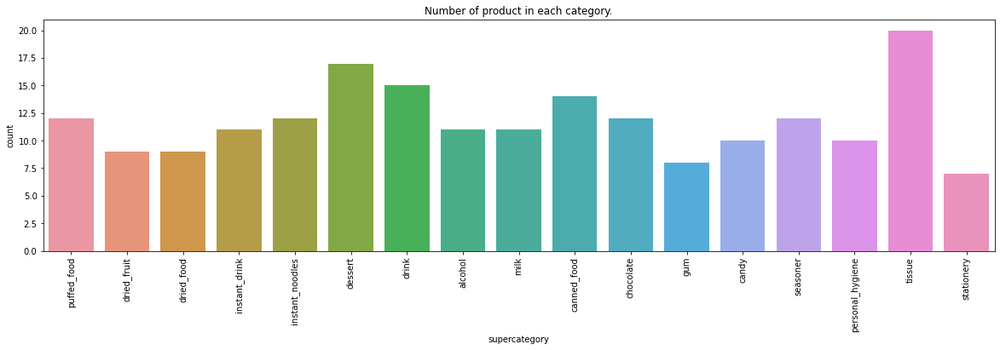

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
 
# read a tips.csv file from seaborn library
plt.figure(figsize=(20,5))
df = sns.load_dataset('tips')
 
# count plot on single categorical variable
plt.title('Number of product in each category.')
sns.countplot(x ='supercategory', data = retail_product_info)
plt.xticks(rotation=90)
 
# Show the plot
plt.show()

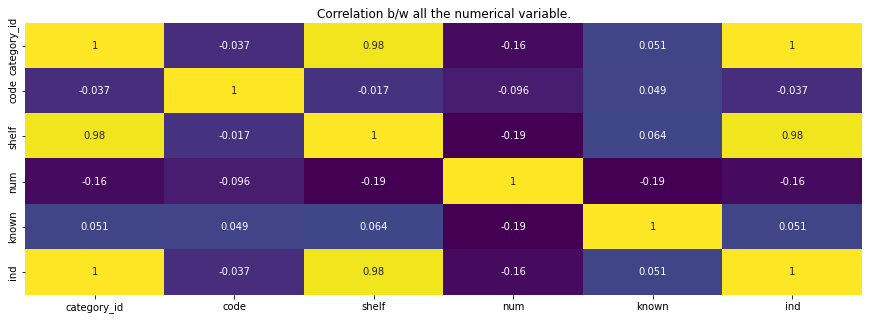

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(15,5))
plt.title('Correlation b/w all the numerical variable.')
sns.heatmap(retail_product_info.corr(), cbar = False,annot=True,cmap='viridis')

## Data Images.

In [20]:
images_df = pd.DataFrame(data['images'])
images_df=images_df.rename(columns={'id': 'category_id'})
images_df.head()

,file_name,width,height,category_id
0,038900004095_camera0-13.jpg,2592,1944,0
1,038900004095_camera0-18.jpg,2592,1944,1
2,038900004095_camera0-11.jpg,2592,1944,2
3,038900004095_camera0-10.jpg,2592,1944,3
4,038900004095_camera0-17.jpg,2592,1944,4


In [21]:
images_df[['width', 'height']].describe()

,width,height
count,53739.0,53739.0
mean,2592.0,1944.0
std,0.0,0.0
min,2592.0,1944.0
25%,2592.0,1944.0
50%,2592.0,1944.0
75%,2592.0,1944.0
max,2592.0,1944.0


## Train Annotations

In [22]:
anns_df = pd.DataFrame(data['annotations']) 
anns_df.head()

,area,bbox,category_id,id,image_id,iscrowd,segmentation,point_xy
0,111763.29,"[1188.4, 1052.45, 390.96, 285.87]",112,0,0,0,[[]],"[1383.88, 1195.38]"
1,110516.13,"[1214.89, 1053.72, 392.36, 281.67]",112,1,1,0,[[]],"[1411.07, 1194.56]"
2,108233.00,"[1180.52, 1055.31, 384.33, 281.62]",112,2,2,0,[[]],"[1372.68, 1196.12]"
3,113598.14,"[1171.68, 1047.6, 399.85, 284.1]",112,3,3,0,[[]],"[1371.61, 1189.65]"
4,115162.14,"[1197.98, 1052.86, 413.0, 278.84]",112,4,4,0,[[]],"[1404.48, 1192.28]"


In [23]:
train_images=pd.merge(images_df,anns_df,left_on='category_id',right_on='image_id')
train_images.head()

,file_name,width,height,category_id_x,area,bbox,category_id_y,id,image_id,iscrowd,segmentation,point_xy
0,038900004095_camera0-13.jpg,2592,1944,0,111763.29,"[1188.4, 1052.45, 390.96, 285.87]",112,0,0,0,[[]],"[1383.88, 1195.38]"
1,038900004095_camera0-18.jpg,2592,1944,1,110516.13,"[1214.89, 1053.72, 392.36, 281.67]",112,1,1,0,[[]],"[1411.07, 1194.56]"
2,038900004095_camera0-11.jpg,2592,1944,2,108233.00,"[1180.52, 1055.31, 384.33, 281.62]",112,2,2,0,[[]],"[1372.68, 1196.12]"
3,038900004095_camera0-10.jpg,2592,1944,3,113598.14,"[1171.68, 1047.6, 399.85, 284.1]",112,3,3,0,[[]],"[1371.61, 1189.65]"
4,038900004095_camera0-17.jpg,2592,1944,4,115162.14,"[1197.98, 1052.86, 413.0, 278.84]",112,4,4,0,[[]],"[1404.48, 1192.28]"


In [24]:
train_images=train_images.drop(['category_id_x','id','image_id'],axis=1)
train_images.head()

,file_name,width,height,area,bbox,category_id_y,iscrowd,segmentation,point_xy
0,038900004095_camera0-13.jpg,2592,1944,111763.29,"[1188.4, 1052.45, 390.96, 285.87]",112,0,[[]],"[1383.88, 1195.38]"
1,038900004095_camera0-18.jpg,2592,1944,110516.13,"[1214.89, 1053.72, 392.36, 281.67]",112,0,[[]],"[1411.07, 1194.56]"
2,038900004095_camera0-11.jpg,2592,1944,108233.00,"[1180.52, 1055.31, 384.33, 281.62]",112,0,[[]],"[1372.68, 1196.12]"
3,038900004095_camera0-10.jpg,2592,1944,113598.14,"[1171.68, 1047.6, 399.85, 284.1]",112,0,[[]],"[1371.61, 1189.65]"
4,038900004095_camera0-17.jpg,2592,1944,115162.14,"[1197.98, 1052.86, 413.0, 278.84]",112,0,[[]],"[1404.48, 1192.28]"


In [25]:
train=pd.merge(train_images,retail_product_info,left_on='category_id_y',right_on='category_id',how='left')
print(train.shape)
train.head()

(53739, 19)


,file_name,width,height,area,bbox,category_id_y,iscrowd,segmentation,point_xy,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,038900004095_camera0-13.jpg,2592,1944,111763.29,"[1188.4, 1052.45, 390.96, 285.87]",112,0,[[]],"[1383.88, 1195.38]",canned_food,112,112_canned_food,38900004095,3,5,都乐菠萝块234g,罐头,False,111
1,038900004095_camera0-18.jpg,2592,1944,110516.13,"[1214.89, 1053.72, 392.36, 281.67]",112,0,[[]],"[1411.07, 1194.56]",canned_food,112,112_canned_food,38900004095,3,5,都乐菠萝块234g,罐头,False,111
2,038900004095_camera0-11.jpg,2592,1944,108233.00,"[1180.52, 1055.31, 384.33, 281.62]",112,0,[[]],"[1372.68, 1196.12]",canned_food,112,112_canned_food,38900004095,3,5,都乐菠萝块234g,罐头,False,111
3,038900004095_camera0-10.jpg,2592,1944,113598.14,"[1171.68, 1047.6, 399.85, 284.1]",112,0,[[]],"[1371.61, 1189.65]",canned_food,112,112_canned_food,38900004095,3,5,都乐菠萝块234g,罐头,False,111
4,038900004095_camera0-17.jpg,2592,1944,115162.14,"[1197.98, 1052.86, 413.0, 278.84]",112,0,[[]],"[1404.48, 1192.28]",canned_food,112,112_canned_food,38900004095,3,5,都乐菠萝块234g,罐头,False,111


In [26]:
!pwd

/content/gdrive/MyDrive/Self_checkout


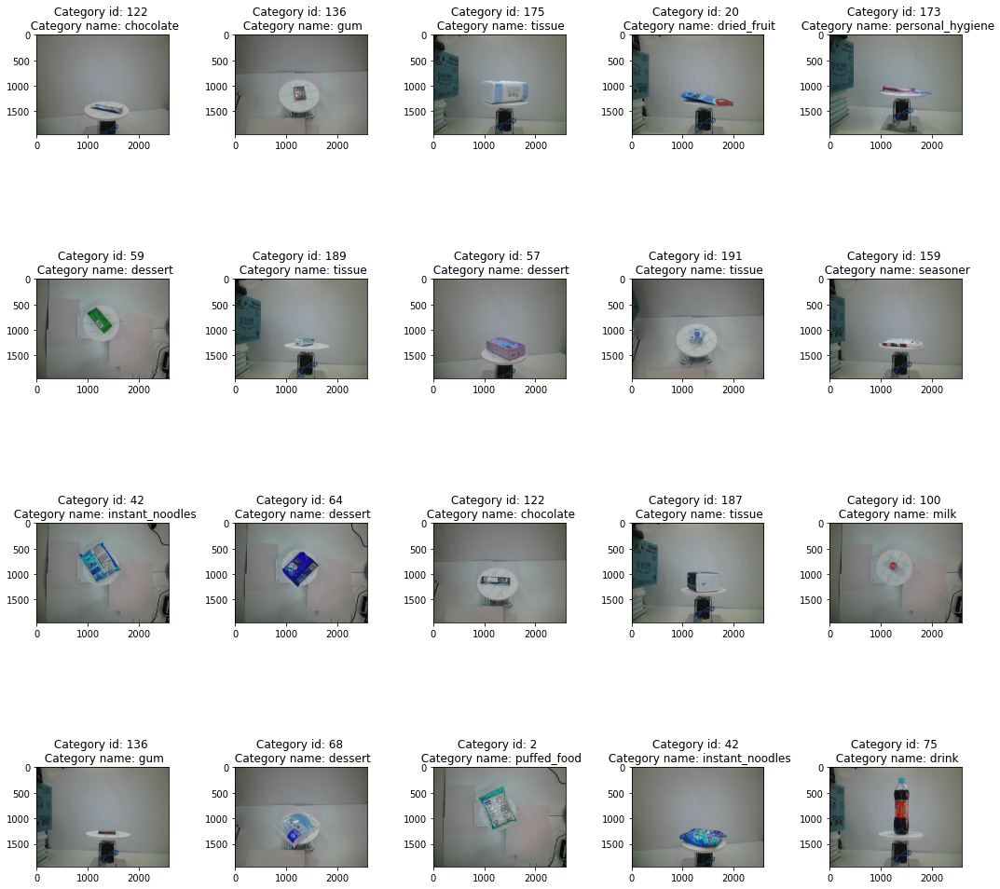

In [29]:
import random as rn
import cv2
INPUT_PATH='train'
fig,ax=plt.subplots(4,5)
fig.set_size_inches(15,15)
for i in range(4):
    for j in range(5):
        l=rn.randint(0,train.shape[0])
        img = cv2.imread(INPUT_PATH+'/'+train.iloc[l]['file_name'],cv2.IMREAD_COLOR)
        #img = cv2.resize(img, (224,224))
        ax[i,j].imshow(img)
        ax[i,j].set_title('Category id: {} \n Category name: {}'.format(str(train.iloc[l]['category_id']),str(train.iloc[l]['supercategory'])))
plt.tight_layout()

In [30]:
train=train[['file_name','width','height','bbox','name']]

In [31]:
train.to_csv('train.csv',index=False)

In [32]:
train.shape

(53739, 5)

In [ ]:
!pwd

/content/gdrive/MyDrive/Self_checkout


# **Exploratory Data Analysis for Test Datasets**

In [33]:
import boxx
data = boxx.loadjson('test.json')


# Visualization struct of instances_train2019.json
# These annotation files has similar struct as COCO Object Detection Dataset
boxx.tree(data, deep=1)

└── /: dict  6
    ├── info: dict  7
    ├── licenses: list  1
    ├── categories: list  200
    ├── __raw_Chinese_name_df: list  200
    ├── images: list  24000
    └── annotations: list  294333


In [34]:
print(type(data))
data.keys()

<class 'dict'>


dict_keys(['info', 'licenses', 'categories', '__raw_Chinese_name_df', 'images', 'annotations'])

In [35]:
categories_df = pd.DataFrame(data['categories'])
categories_df=categories_df.rename(columns={'id': 'category_id'})
#categories_df = categories_df[["supercategory", "name"]]
print('Type of categories:- ',categories_df.shape[0])
categories_df.head()

Type of categories:-  200


,supercategory,category_id,name
0,puffed_food,1,1_puffed_food
1,puffed_food,2,2_puffed_food
2,puffed_food,3,3_puffed_food
3,puffed_food,4,4_puffed_food
4,puffed_food,5,5_puffed_food


In [36]:
categories_grp = categories_df.groupby('supercategory', as_index=False)
categories_grp.groups

{'alcohol': [78, 79, 87, 88, 89, 90, 91, 92, 93, 94, 95], 'candy': [141, 142, 143, 144, 145, 146, 147, 148, 149, 150], 'canned_food': [107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120], 'chocolate': [121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132], 'dessert': [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69], 'dried_food': [21, 22, 23, 24, 25, 26, 27, 28, 29], 'dried_fruit': [12, 13, 14, 15, 16, 17, 18, 19, 20], 'drink': [70, 71, 72, 73, 74, 75, 76, 77, 80, 81, 82, 83, 84, 85, 86], 'gum': [133, 134, 135, 136, 137, 138, 139, 140], 'instant_drink': [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40], 'instant_noodles': [41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52], 'milk': [96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106], 'personal_hygiene': [163, 164, 165, 166, 167, 168, 169, 170, 171, 172], 'puffed_food': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], 'seasoner': [151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162], 'stationery': [193,

In [37]:
raw_Chinese_name_df = pd.DataFrame(data['__raw_Chinese_name_df'])
raw_Chinese_name_df=raw_Chinese_name_df.rename(columns={'name': 'product_description','clas':'product_class'})
raw_Chinese_name_df.head()

,sku_name,category_id,sku_class,code,shelf,num,product_description,product_class,known,ind
0,1_puffed_food,1,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,2_puffed_food,2,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,3_puffed_food,3,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,4_puffed_food,4,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,5_puffed_food,5,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [38]:
raw_Chinese_name_df.groupby(['sku_class', 'product_class'], as_index=False).size()

,sku_class,product_class,size
0,alcohol,酒,11
1,candy,糖果,10
2,canned_food,罐头,14
3,chocolate,巧克力,12
4,dessert,饼干点心,17
5,dried_food,干货,9
6,dried_fruit,果仁果脯,9
7,drink,饮料,15
8,gum,口香糖,8
9,instant_drink,冲调,11


In [39]:
retail_product_info = pd.merge(categories_df, raw_Chinese_name_df, on=["category_id"])
retail_product_info.head()

,supercategory,category_id,name,sku_name,sku_class,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,1_puffed_food,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,2_puffed_food,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,3_puffed_food,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,4_puffed_food,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,5_puffed_food,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


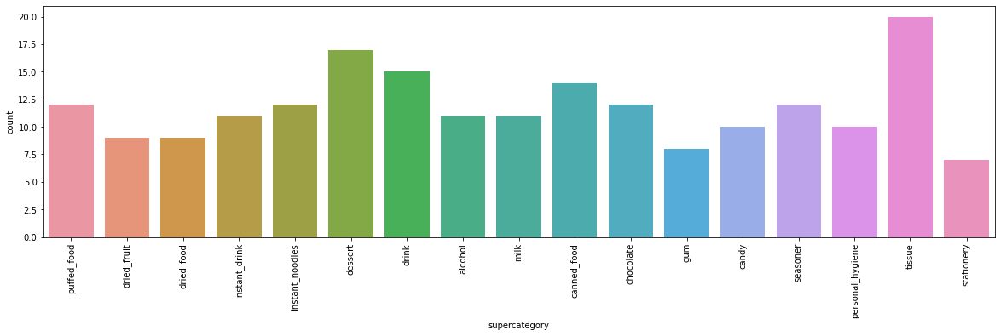

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
 
# read a tips.csv file from seaborn library
plt.figure(figsize=(20,5))
df = sns.load_dataset('tips')
 
# count plot on single categorical variable
sns.countplot(x ='supercategory', data = retail_product_info)
plt.xticks(rotation=90)
 
# Show the plot
plt.show()

In [41]:
retail_product_info=retail_product_info.drop(['sku_name','sku_class'],axis=1)
retail_product_info.head()

,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [42]:
images_df = pd.DataFrame(data['images'])
images_df=images_df.rename(columns={'id': 'category_id'})
images_df.head()

,file_name,width,height,category_id,level
0,20180824-15-44-39-474.jpg,1831,1831,3,easy
1,20180824-15-44-47-474.jpg,1834,1834,4,easy
2,20180824-15-44-56-474.jpg,1839,1839,5,easy
3,20180824-15-50-57-480.jpg,1827,1827,6,easy
4,20180824-15-51-04-480.jpg,1831,1831,7,easy


In [43]:
images_df[['width', 'height']].describe()

,width,height
count,24000.000000,24000.000000
mean,1830.866583,1830.866542
std,20.237546,20.237487
min,1751.000000,1751.000000
25%,1817.000000,1817.000000
50%,1833.000000,1833.000000
75%,1846.000000,1846.000000
max,1906.000000,1906.000000


In [44]:
print('Number of unique image in test datasets:- ',images_df['file_name'].nunique())

Number of unique image in test datasets:-  24000


In [45]:
anns_df = pd.DataFrame(data['annotations'])
anns_df.head()

,area,bbox,category_id,id,image_id,iscrowd,segmentation,point_xy
0,149040.14,"[896.74, 1032.48, 322.61, 461.98]",181,9,3,0,[[]],"[1058.05, 1263.47]"
1,261450.66,"[451.22, 785.58, 478.44, 546.47]",8,10,3,0,[[]],"[690.44, 1058.82]"
2,93244.76,"[793.51, 732.3, 279.87, 333.18]",45,11,3,0,[[]],"[933.44, 898.89]"
3,415934.14,"[566.95, 288.82, 656.82, 633.25]",8,12,4,0,[[]],"[895.36, 605.44]"
4,217678.17,"[887.5, 713.08, 455.69, 477.69]",181,13,4,0,[[]],"[1115.35, 951.93]"


In [46]:
test_images=pd.merge(images_df,anns_df,left_on='category_id',right_on='image_id')
test_images.head()

,file_name,width,height,category_id_x,level,area,bbox,category_id_y,id,image_id,iscrowd,segmentation,point_xy
0,20180824-15-44-39-474.jpg,1831,1831,3,easy,149040.14,"[896.74, 1032.48, 322.61, 461.98]",181,9,3,0,[[]],"[1058.05, 1263.47]"
1,20180824-15-44-39-474.jpg,1831,1831,3,easy,261450.66,"[451.22, 785.58, 478.44, 546.47]",8,10,3,0,[[]],"[690.44, 1058.82]"
2,20180824-15-44-39-474.jpg,1831,1831,3,easy,93244.76,"[793.51, 732.3, 279.87, 333.18]",45,11,3,0,[[]],"[933.44, 898.89]"
3,20180824-15-44-47-474.jpg,1834,1834,4,easy,415934.14,"[566.95, 288.82, 656.82, 633.25]",8,12,4,0,[[]],"[895.36, 605.44]"
4,20180824-15-44-47-474.jpg,1834,1834,4,easy,217678.17,"[887.5, 713.08, 455.69, 477.69]",181,13,4,0,[[]],"[1115.35, 951.93]"


In [47]:
test_images=test_images.drop(['category_id_x','id','image_id'],axis=1)
test_images.head()

,file_name,width,height,level,area,bbox,category_id_y,iscrowd,segmentation,point_xy
0,20180824-15-44-39-474.jpg,1831,1831,easy,149040.14,"[896.74, 1032.48, 322.61, 461.98]",181,0,[[]],"[1058.05, 1263.47]"
1,20180824-15-44-39-474.jpg,1831,1831,easy,261450.66,"[451.22, 785.58, 478.44, 546.47]",8,0,[[]],"[690.44, 1058.82]"
2,20180824-15-44-39-474.jpg,1831,1831,easy,93244.76,"[793.51, 732.3, 279.87, 333.18]",45,0,[[]],"[933.44, 898.89]"
3,20180824-15-44-47-474.jpg,1834,1834,easy,415934.14,"[566.95, 288.82, 656.82, 633.25]",8,0,[[]],"[895.36, 605.44]"
4,20180824-15-44-47-474.jpg,1834,1834,easy,217678.17,"[887.5, 713.08, 455.69, 477.69]",181,0,[[]],"[1115.35, 951.93]"


In [48]:
test=pd.merge(test_images,retail_product_info,left_on='category_id_y',right_on='category_id',how='left')
print(test.shape)
test.head()

(294333, 20)


,file_name,width,height,level,area,bbox,category_id_y,iscrowd,segmentation,point_xy,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,20180824-15-44-39-474.jpg,1831,1831,easy,149040.14,"[896.74, 1032.48, 322.61, 461.98]",181,0,[[]],"[1058.05, 1263.47]",tissue,181,181_tissue,6923589421131,6,3,舒洁萌印花120x2,纸巾,True,180
1,20180824-15-44-39-474.jpg,1831,1831,easy,261450.66,"[451.22, 785.58, 478.44, 546.47]",8,0,[[]],"[690.44, 1058.82]",puffed_food,8,8_puffed_food,6909409040799,1,4,上好佳洋葱圈40g,膨化食品,True,7
2,20180824-15-44-39-474.jpg,1831,1831,easy,93244.76,"[793.51, 732.3, 279.87, 333.18]",45,0,[[]],"[933.44, 898.89]",instant_noodles,45,45_instant_noodles,6917536014026,2,4,合味道海鲜风味84g,方便面,False,44
3,20180824-15-44-47-474.jpg,1834,1834,easy,415934.14,"[566.95, 288.82, 656.82, 633.25]",8,0,[[]],"[895.36, 605.44]",puffed_food,8,8_puffed_food,6909409040799,1,4,上好佳洋葱圈40g,膨化食品,True,7
4,20180824-15-44-47-474.jpg,1834,1834,easy,217678.17,"[887.5, 713.08, 455.69, 477.69]",181,0,[[]],"[1115.35, 951.93]",tissue,181,181_tissue,6923589421131,6,3,舒洁萌印花120x2,纸巾,True,180


In [49]:
new = test.groupby(['level'], as_index=False).size()
new.head()

,level,size
0,easy,57215
1,hard,138889
2,medium,98229


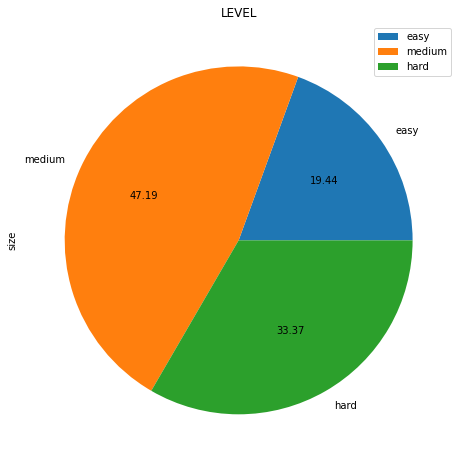

In [50]:
test.groupby(['level'], as_index=False).size().plot.pie(figsize=(8,8), labels=['easy','medium','hard'],y='size', autopct='%.2f', title='LEVEL');

In [51]:
test=test.drop(['category_id_y'],axis=1)

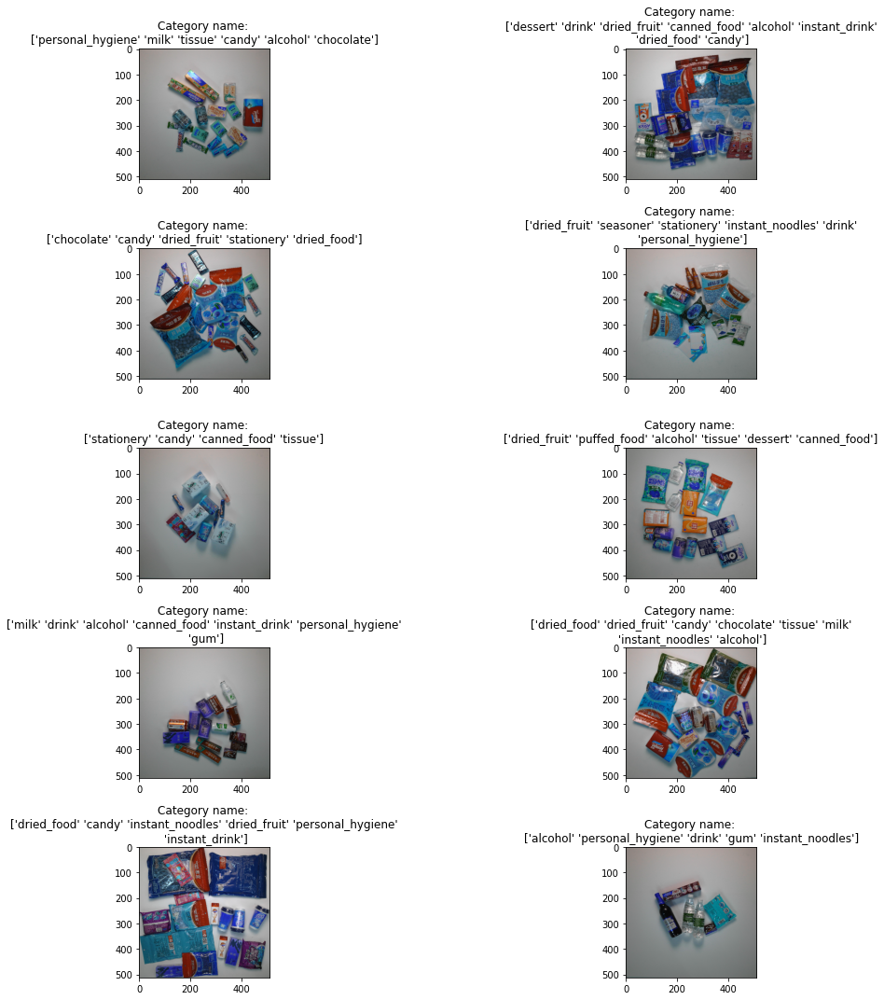

In [52]:
import random as rn
import matplotlib.pyplot as plt
import cv2
INPUT_PATH='test'
fig,ax=plt.subplots(5,2)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (2):
        category_id=[]
        category_name=[]
        l=rn.randint(0,test.shape[0])
        #print(INPUT_PATH+'/'+test.iloc[l]['file_name'])
        file_name=test.iloc[l]['file_name']
        data=test[test['file_name'] == file_name]
        #print(data['category_id'].values)
        #print(data['supercategory'].values)
        img = cv2.imread(INPUT_PATH+'/'+test.iloc[l]['file_name'],cv2.IMREAD_COLOR)
        img = cv2.resize(img, (512,512))
        ax[i,j].imshow(img)
        ax[i,j].set_title('Category name: \n{}'.format(str(data['supercategory'].unique())))
plt.tight_layout()

In [53]:
test_images_0928_df = test[test['file_name'].str.contains('20180907-14-07-00-695.jpg')]
print(test_images_0928_df.shape)
test_images_0928_df.head()

(9, 19)


,file_name,width,height,level,area,bbox,iscrowd,segmentation,point_xy,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
50481,20180907-14-07-00-695.jpg,1841,1841,easy,78480.71,"[717.91, 549.74, 346.14, 226.73]",0,[[]],"[890.98, 663.11]",alcohol,90,90_alcohol,6906151601353,3,5,牛栏山二锅头100ml,酒,False,89
50482,20180907-14-07-00-695.jpg,1841,1841,easy,349710.83,"[915.92, 259.53, 545.66, 640.89]",0,[[]],"[1188.75, 579.97]",stationery,196,196_stationery,6951384903194,6,8,票据文件袋,文具,True,195
50483,20180907-14-07-00-695.jpg,1841,1841,easy,356597.10,"[1039.87, 694.85, 569.85, 625.78]",0,[[]],"[1324.79, 1007.74]",stationery,196,196_stationery,6951384903194,6,8,票据文件袋,文具,True,195
50484,20180907-14-07-00-695.jpg,1841,1841,easy,284079.58,"[1062.54, 891.35, 591.01, 480.67]",0,[[]],"[1358.05, 1131.68]",stationery,196,196_stationery,6951384903194,6,8,票据文件袋,文具,True,195
50485,20180907-14-07-00-695.jpg,1841,1841,easy,79914.23,"[902.37, 825.04, 333.15, 239.87]",0,[[]],"[1068.94, 944.97]",alcohol,90,90_alcohol,6906151601353,3,5,牛栏山二锅头100ml,酒,False,89


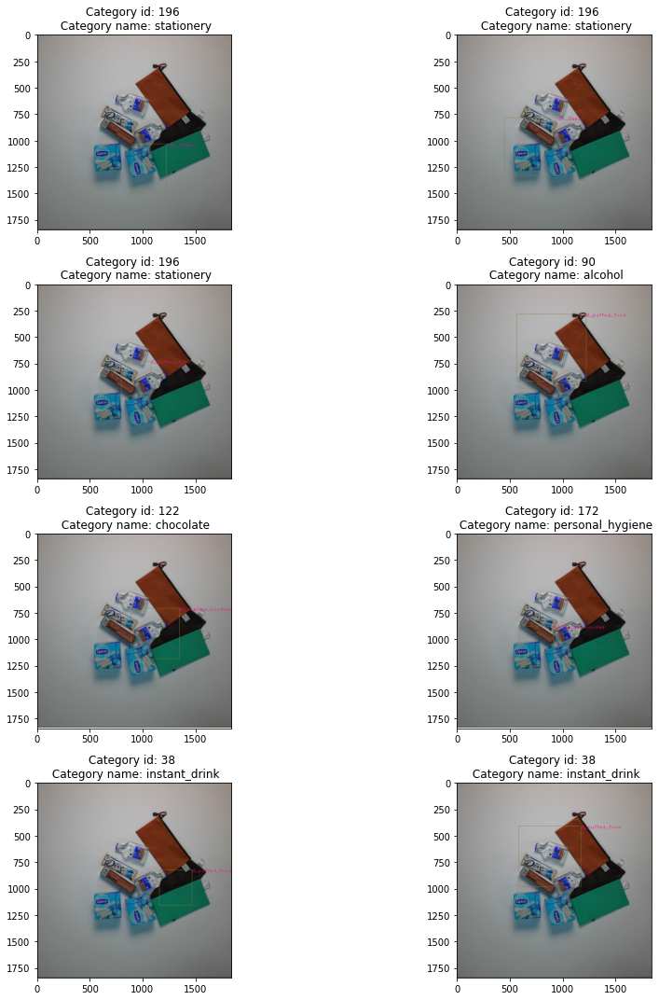

In [54]:
import random as rn
import cv2
font = cv2.FONT_HERSHEY_PLAIN
INPUT_PATH='test'
fig,ax=plt.subplots(4,2)
fig.set_size_inches(15,15)
l=0
for i in range(4):
    for j in range (2):
        #l=rn.randint(0,test_images_0928_df.shape[0])
        #print(INPUT_PATH+'/'+test.iloc[l]['file_name'])
        label=test.loc[i]['name']
        img = cv2.imread(INPUT_PATH+'/'+test_images_0928_df.iloc[l]['file_name'],cv2.IMREAD_COLOR)
        xmin, ymin, width, height=test.iloc[l]['bbox']
        xmax, ymax = xmin + width, ymin + height
        xpoint, ypoint = test.iloc[l]['point_xy']
        xpoint, ypoint = int(xpoint), int(ypoint)
        cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (128, 128,64), 2)
        cv2.putText(img, label, (int(xmax), int(ymin)+25),  font, 3, (255,0,128), 2)
        l+=1
        ax[i,j].imshow(img)
        ax[i,j].set_title('Category id: {} \n Category name: {}'.format(str(test_images_0928_df.iloc[l]['category_id']),str(test_images_0928_df.iloc[l]['supercategory'])))
plt.tight_layout()

In [55]:
test['level'].value_counts()

hard      138889
medium     98229
easy       57215
Name: level, dtype: int64

In [56]:
#img = cv2.imread(INPUT_PATH+'/'+test_images_0928_df.iloc[l]['file_name'],cv2.IMREAD_COLOR)
def annotate_image(data, resize=True):
    #print(DATA_ROOT+data['file_name'][0])
    img = cv2.imread(INPUT_PATH+'/'+data.iloc[0]['file_name'],cv2.IMREAD_COLOR)

    for i, a in data.iterrows():
        xmin, ymin, width, height = a.bbox
        xmax, ymax = xmin + width, ymin + height
        xpoint, ypoint = a.point_xy
        xpoint, ypoint = int(xpoint), int(ypoint)
        cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (255, 255, 255), 2)
        cv2.rectangle(img, (xpoint-20, ypoint-20), (xpoint + 20, ypoint + 20), (0, 255, 0), 5)

    if not resize:
        return img

    return cv2.resize(img, (200, 200), interpolation = cv2.INTER_AREA)

In [57]:
colours = np.random.randint(0, 255, size=(test['supercategory'].nunique(), 3), dtype='uint8')
supercategory=test['supercategory'].unique()
colours=dict(zip(supercategory, colours))
print(colours)

{'tissue': array([226, 111, 150], dtype=uint8), 'puffed_food': array([ 66, 223, 214], dtype=uint8), 'instant_noodles': array([ 66, 167,  54], dtype=uint8), 'chocolate': array([155, 105,  49], dtype=uint8), 'instant_drink': array([240,  18, 203], dtype=uint8), 'candy': array([ 11, 254,  19], dtype=uint8), 'dessert': array([ 54,  64, 210], dtype=uint8), 'canned_food': array([230, 146, 107], dtype=uint8), 'dried_fruit': array([240,  16, 210], dtype=uint8), 'seasoner': array([127, 171, 178], dtype=uint8), 'personal_hygiene': array([250,  66,  18], dtype=uint8), 'milk': array([145,  28, 163], dtype=uint8), 'drink': array([34,  0, 60], dtype=uint8), 'alcohol': array([208, 252, 235], dtype=uint8), 'dried_food': array([183, 225,  57], dtype=uint8), 'stationery': array([101,  45, 188], dtype=uint8), 'gum': array([209, 154,  28], dtype=uint8)}


In [58]:
font = cv2.FONT_HERSHEY_PLAIN
def annotate_image(data, resize=True):
    #print(DATA_ROOT+data['file_name'][0])
    img = cv2.imread(INPUT_PATH+'/'+data.iloc[0]['file_name'],cv2.IMREAD_COLOR)
    
    #print(colours)
    #print(colours)
    class_numbers=data['name'].unique()
    colors = np.random.uniform(0, 255, size=(len(class_numbers),3))
    class_numbers= {class_numbers[i]: colors[i] for i in range(len(class_numbers))}
    count=0
    for i, a in data.iterrows():
        label=data.loc[i]['name']
        xmin, ymin, width, height = a.bbox
        xmax, ymax = xmin + width, ymin + height
        xpoint, ypoint = a.point_xy
        xpoint, ypoint = int(xpoint), int(ypoint)
        color=class_numbers[label]
        #print(colour_box_current)
        cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color, 2)
        cv2.putText(img, label, (int(xmax), int(ymin)+25),  font, 3, (255,0,255), 2)
    if not resize:
        return img

    return img

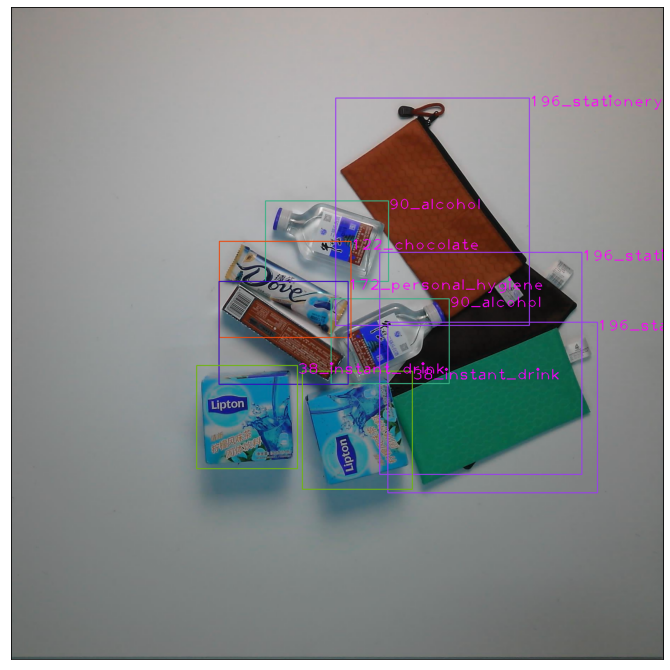

In [59]:
val_sample_img0_cv2 = annotate_image(test_images_0928_df, True)
plt.figure(figsize=(12, 12))
plt.xticks([])
plt.yticks([])
plt.imshow(val_sample_img0_cv2);

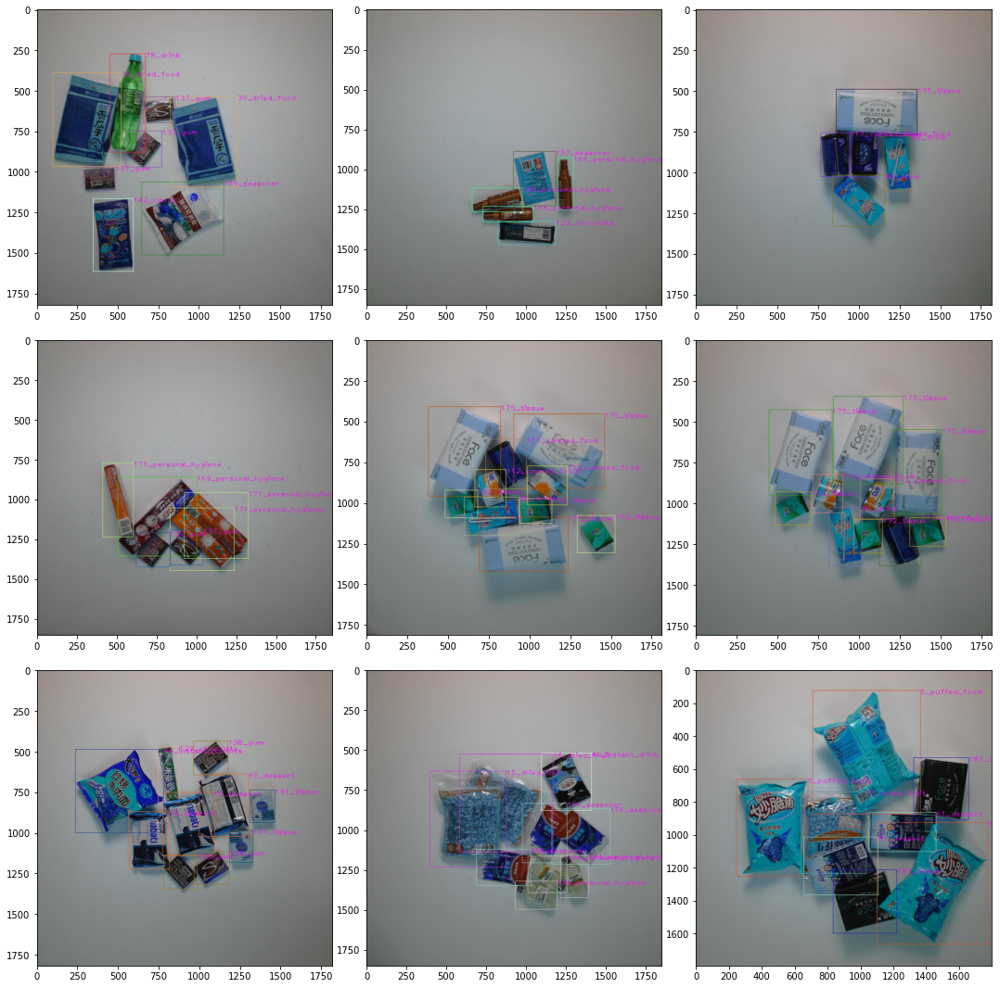

In [60]:
import random as rn
import cv2
INPUT_PATH='test'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
test_easy=test[test['level']=='easy']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,test_easy.shape[0])
        file_name=test_easy.iloc[l]['file_name']
        #print(file_name)
        data=test_easy[test_easy['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

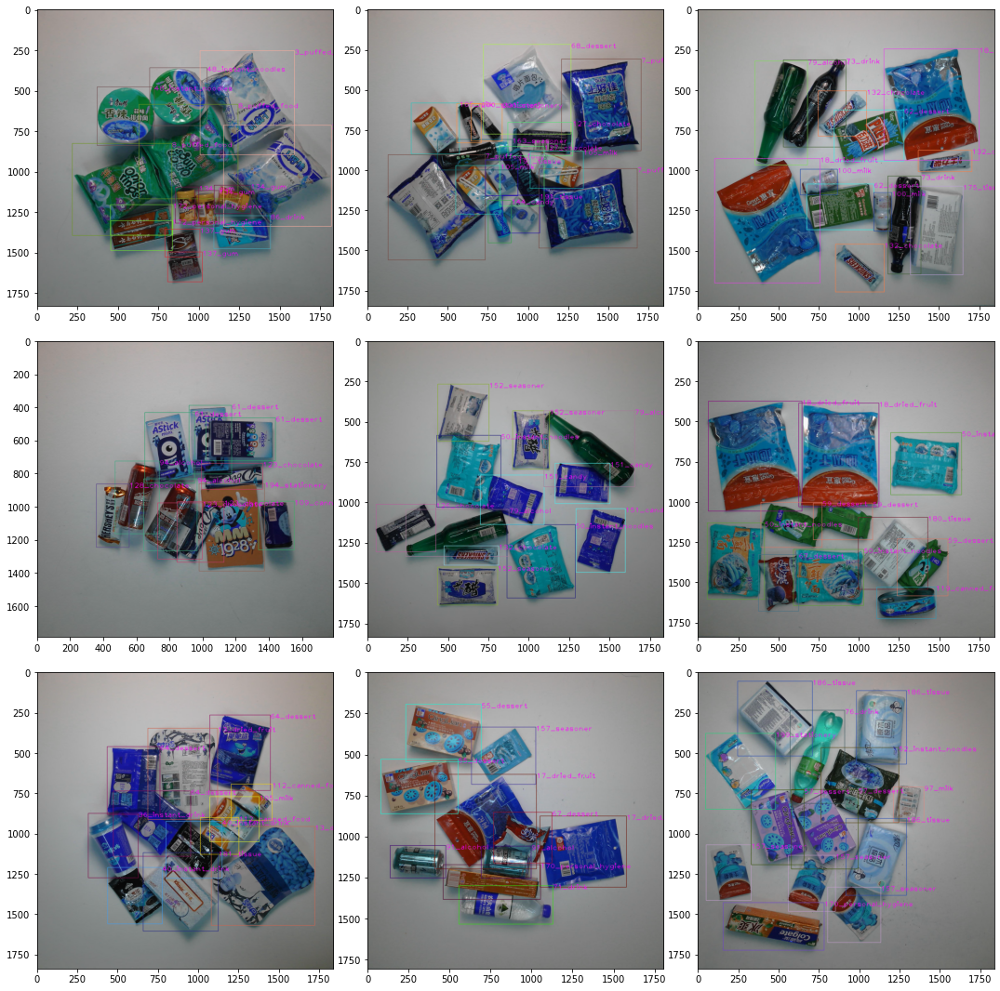

In [61]:
import random as rn
import cv2
INPUT_PATH='test'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
test_medium=test[test['level']=='medium']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,test_medium.shape[0])
        file_name=test_medium.iloc[l]['file_name']
        #print(file_name)
        data=test_medium[test_medium['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

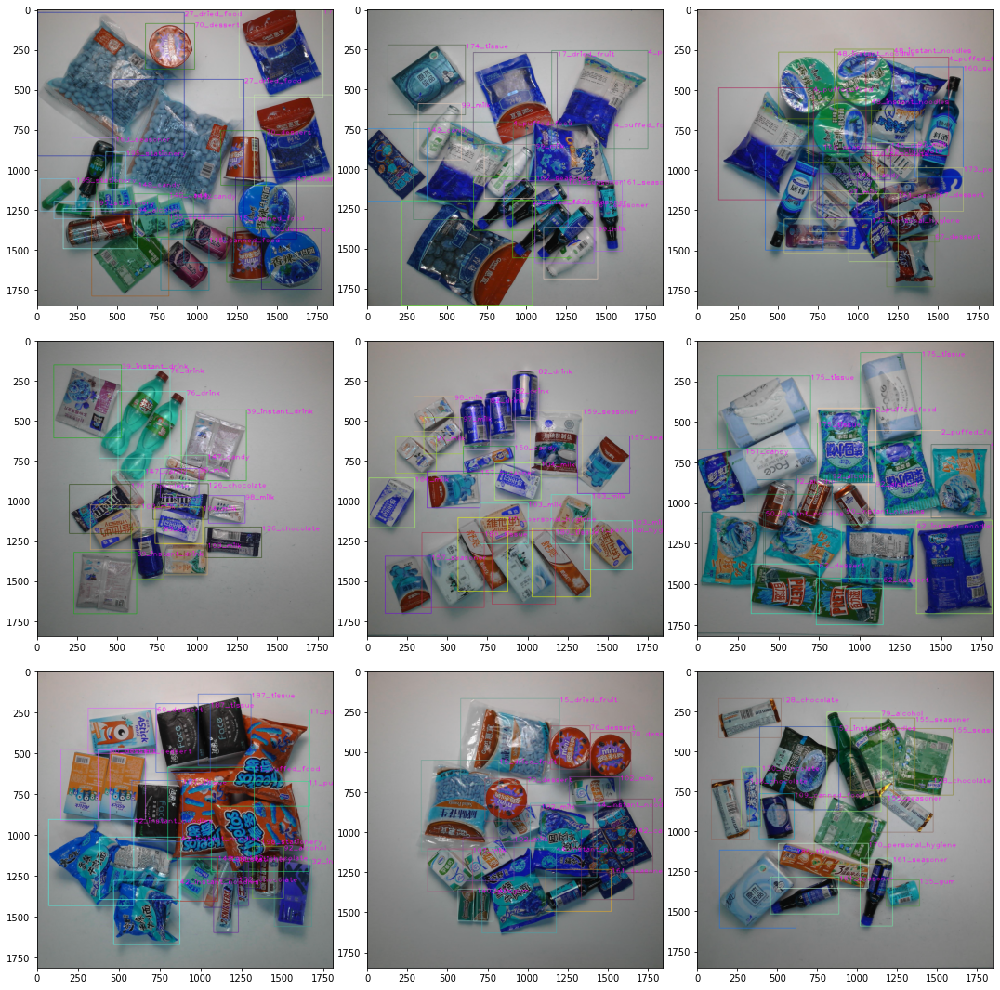

In [62]:
import random as rn
import cv2
INPUT_PATH='test'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
test_hard=test[test['level']=='hard']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,test_hard.shape[0])
        file_name=test_hard.iloc[l]['file_name']
        #print(file_name)
        data=test_hard[test_hard['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000.]),
 <a list of 7 Text major ticklabel objects>)

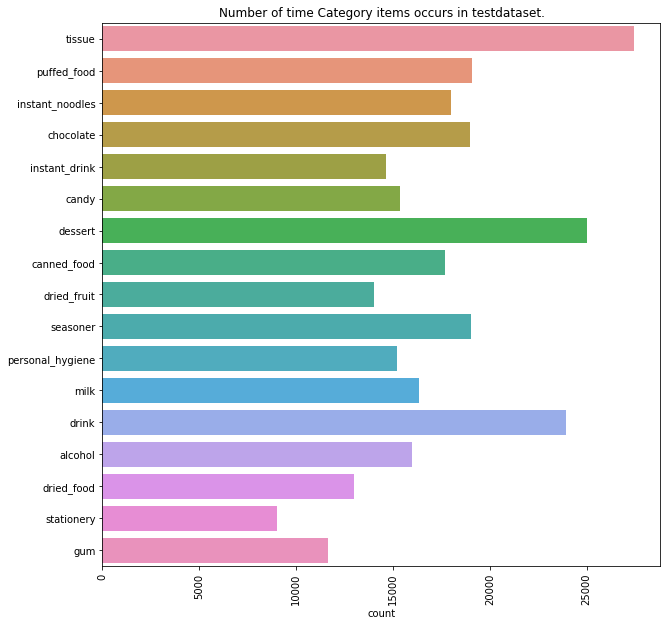

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,10))
plt.title('Number of time Category items occurs in testdataset.')
sns.countplot(y=test['supercategory'].values)
plt.xticks(rotation=90)

In [64]:
test.shape

(294333, 19)

In [65]:
test=test[['file_name','width','height','bbox','name']]

# **Exploratory Data Analysis for Validation Datasets**

In [66]:
import boxx
data = boxx.loadjson('val.json')


# Visualization struct of instances_train2019.json
# These annotation files has similar struct as COCO Object Detection Dataset
boxx.tree(data, deep=1)

└── /: dict  6
    ├── info: dict  7
    ├── licenses: list  1
    ├── categories: list  200
    ├── __raw_Chinese_name_df: list  200
    ├── images: list  6000
    └── annotations: list  73602


In [67]:
print(type(data))
data.keys()

<class 'dict'>


dict_keys(['info', 'licenses', 'categories', '__raw_Chinese_name_df', 'images', 'annotations'])

In [68]:
categories_df = pd.DataFrame(data['categories'])
categories_df=categories_df.rename(columns={'id': 'category_id'})
#categories_df = categories_df[["supercategory", "name"]]
print('Type of categories:- ',categories_df.shape[0])
categories_df.head()

Type of categories:-  200


,supercategory,category_id,name
0,puffed_food,1,1_puffed_food
1,puffed_food,2,2_puffed_food
2,puffed_food,3,3_puffed_food
3,puffed_food,4,4_puffed_food
4,puffed_food,5,5_puffed_food


In [69]:
categories_grp = categories_df.groupby('supercategory', as_index=False)
categories_grp.groups

{'alcohol': [78, 79, 87, 88, 89, 90, 91, 92, 93, 94, 95], 'candy': [141, 142, 143, 144, 145, 146, 147, 148, 149, 150], 'canned_food': [107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120], 'chocolate': [121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132], 'dessert': [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69], 'dried_food': [21, 22, 23, 24, 25, 26, 27, 28, 29], 'dried_fruit': [12, 13, 14, 15, 16, 17, 18, 19, 20], 'drink': [70, 71, 72, 73, 74, 75, 76, 77, 80, 81, 82, 83, 84, 85, 86], 'gum': [133, 134, 135, 136, 137, 138, 139, 140], 'instant_drink': [30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40], 'instant_noodles': [41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52], 'milk': [96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106], 'personal_hygiene': [163, 164, 165, 166, 167, 168, 169, 170, 171, 172], 'puffed_food': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], 'seasoner': [151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162], 'stationery': [193,

In [70]:
raw_Chinese_name_df = pd.DataFrame(data['__raw_Chinese_name_df'])
raw_Chinese_name_df=raw_Chinese_name_df.rename(columns={'name': 'product_description','clas':'product_class'})
raw_Chinese_name_df.head()

,sku_name,category_id,sku_class,code,shelf,num,product_description,product_class,known,ind
0,1_puffed_food,1,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,2_puffed_food,2,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,3_puffed_food,3,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,4_puffed_food,4,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,5_puffed_food,5,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [71]:
raw_Chinese_name_df.groupby(['sku_class', 'product_class'], as_index=False).size()

,sku_class,product_class,size
0,alcohol,酒,11
1,candy,糖果,10
2,canned_food,罐头,14
3,chocolate,巧克力,12
4,dessert,饼干点心,17
5,dried_food,干货,9
6,dried_fruit,果仁果脯,9
7,drink,饮料,15
8,gum,口香糖,8
9,instant_drink,冲调,11


In [72]:
retail_product_info = pd.merge(categories_df, raw_Chinese_name_df, on=["category_id"])
retail_product_info.head()

,supercategory,category_id,name,sku_name,sku_class,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,1_puffed_food,puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,2_puffed_food,puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,3_puffed_food,puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,4_puffed_food,puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,5_puffed_food,puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [73]:
retail_product_info=retail_product_info.drop(['sku_name','sku_class'],axis=1)
retail_product_info.head()

,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,puffed_food,1,1_puffed_food,6909409012031,1,4,上好佳荷兰豆55g,膨化食品,True,0
1,puffed_food,2,2_puffed_food,6901845043112,1,5,菜园小饼80g,膨化食品,True,1
2,puffed_food,3,3_puffed_food,6909409012024,1,5,上好佳鲜虾片40g,膨化食品,True,2
3,puffed_food,4,4_puffed_food,6926265388100,1,5,上好佳蟹味逸族40g,膨化食品,True,3
4,puffed_food,5,5_puffed_food,6924743920330,1,4,妙脆角魔力炭烧味65g,膨化食品,True,4


In [74]:
images_df = pd.DataFrame(data['images'])
images_df=images_df.rename(columns={'id': 'category_id'})
images_df.head()

,file_name,width,height,category_id,level
0,20180827-16-07-06-756.jpg,1850,1850,220,easy
1,20180827-16-07-10-756.jpg,1840,1840,221,easy
2,20180827-16-24-37-306.jpg,1826,1826,222,easy
3,20180827-16-24-44-306.jpg,1829,1829,223,easy
4,20180827-16-24-53-306.jpg,1826,1826,224,easy


In [75]:
print('Number of unique image in validation datasets:- ',images_df['file_name'].nunique())

Number of unique image in validation datasets:-  6000


In [76]:
anns_df = pd.DataFrame(data['annotations'])
anns_df.head()

,area,bbox,category_id,id,image_id,iscrowd,segmentation,point_xy
0,145968.80,"[519.44, 965.19, 405.05, 360.37]",96,751,220,0,[[]],"[721.97, 1145.38]"
1,96655.05,"[282.17, 962.21, 278.97, 346.48]",111,752,220,0,[[]],"[421.66, 1135.45]"
2,85148.42,"[477.74, 1181.62, 236.28, 360.37]",87,753,220,0,[[]],"[595.88, 1361.8]"
3,87298.95,"[726.93, 1245.15, 343.5, 254.15]",87,754,220,0,[[]],"[898.68, 1372.23]"
4,60313.52,"[1223.01, 286.82, 171.8, 351.07]",87,755,221,0,[[]],"[1308.91, 462.36]"


In [77]:
val_images=pd.merge(images_df,anns_df,left_on='category_id',right_on='image_id')
val_images.head()

,file_name,width,height,category_id_x,level,area,bbox,category_id_y,id,image_id,iscrowd,segmentation,point_xy
0,20180827-16-07-06-756.jpg,1850,1850,220,easy,145968.80,"[519.44, 965.19, 405.05, 360.37]",96,751,220,0,[[]],"[721.97, 1145.38]"
1,20180827-16-07-06-756.jpg,1850,1850,220,easy,96655.05,"[282.17, 962.21, 278.97, 346.48]",111,752,220,0,[[]],"[421.66, 1135.45]"
2,20180827-16-07-06-756.jpg,1850,1850,220,easy,85148.42,"[477.74, 1181.62, 236.28, 360.37]",87,753,220,0,[[]],"[595.88, 1361.8]"
3,20180827-16-07-06-756.jpg,1850,1850,220,easy,87298.95,"[726.93, 1245.15, 343.5, 254.15]",87,754,220,0,[[]],"[898.68, 1372.23]"
4,20180827-16-07-10-756.jpg,1840,1840,221,easy,60313.52,"[1223.01, 286.82, 171.8, 351.07]",87,755,221,0,[[]],"[1308.91, 462.36]"


In [78]:
val_images=val_images.drop(['category_id_x','id','image_id'],axis=1)
val_images.head()

,file_name,width,height,level,area,bbox,category_id_y,iscrowd,segmentation,point_xy
0,20180827-16-07-06-756.jpg,1850,1850,easy,145968.80,"[519.44, 965.19, 405.05, 360.37]",96,0,[[]],"[721.97, 1145.38]"
1,20180827-16-07-06-756.jpg,1850,1850,easy,96655.05,"[282.17, 962.21, 278.97, 346.48]",111,0,[[]],"[421.66, 1135.45]"
2,20180827-16-07-06-756.jpg,1850,1850,easy,85148.42,"[477.74, 1181.62, 236.28, 360.37]",87,0,[[]],"[595.88, 1361.8]"
3,20180827-16-07-06-756.jpg,1850,1850,easy,87298.95,"[726.93, 1245.15, 343.5, 254.15]",87,0,[[]],"[898.68, 1372.23]"
4,20180827-16-07-10-756.jpg,1840,1840,easy,60313.52,"[1223.01, 286.82, 171.8, 351.07]",87,0,[[]],"[1308.91, 462.36]"


In [79]:
valid=pd.merge(val_images,retail_product_info,left_on='category_id_y',right_on='category_id',how='left')
print(valid.shape)
valid.head()

(73602, 20)


,file_name,width,height,level,area,bbox,category_id_y,iscrowd,segmentation,point_xy,supercategory,category_id,name,code,shelf,num,product_description,product_class,known,ind
0,20180827-16-07-06-756.jpg,1850,1850,easy,145968.80,"[519.44, 965.19, 405.05, 360.37]",96,0,[[]],"[721.97, 1145.38]",alcohol,96,96_alcohol,6948960100078,3,3,百威啤酒500ml,酒,True,95
1,20180827-16-07-06-756.jpg,1850,1850,easy,96655.05,"[282.17, 962.21, 278.97, 346.48]",111,0,[[]],"[421.66, 1135.45]",canned_food,111,111_canned_food,4800009004827,3,5,都乐菠萝块567g,罐头,False,110
2,20180827-16-07-06-756.jpg,1850,1850,easy,85148.42,"[477.74, 1181.62, 236.28, 360.37]",87,0,[[]],"[595.88, 1361.8]",drink,87,87_drink,4891599601138,3,5,加多宝250ml,饮料,True,86
3,20180827-16-07-06-756.jpg,1850,1850,easy,87298.95,"[726.93, 1245.15, 343.5, 254.15]",87,0,[[]],"[898.68, 1372.23]",drink,87,87_drink,4891599601138,3,5,加多宝250ml,饮料,True,86
4,20180827-16-07-10-756.jpg,1840,1840,easy,60313.52,"[1223.01, 286.82, 171.8, 351.07]",87,0,[[]],"[1308.91, 462.36]",drink,87,87_drink,4891599601138,3,5,加多宝250ml,饮料,True,86


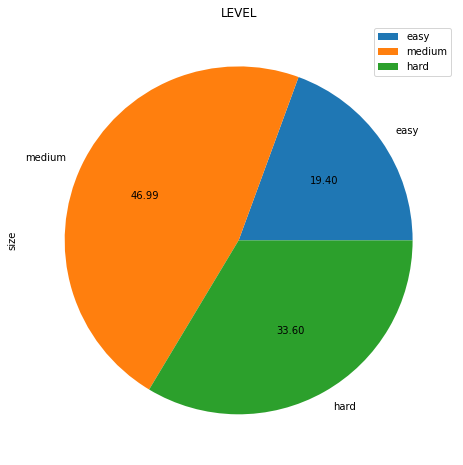

In [80]:
valid.groupby(['level'], as_index=False).size().plot.pie(figsize=(8,8), labels=['easy','medium','hard'],y='size', autopct='%.2f', title='LEVEL');

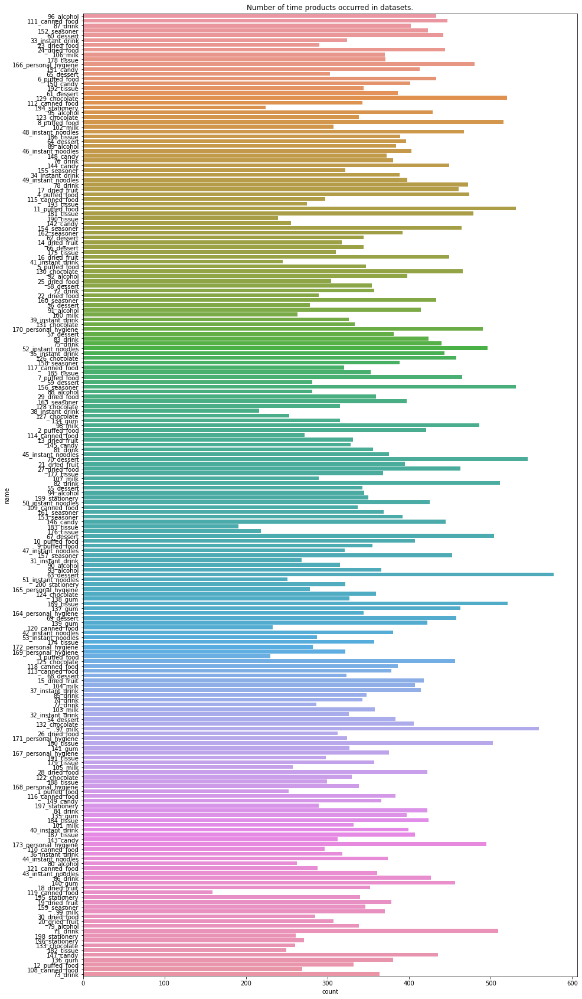

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt
 
# read a tips.csv file from seaborn library
 
# count plot on single categorical variable
plt.figure(figsize=(15,30))
plt.title('Number of time products occurred in datasets.')
sns.countplot(y ='name', data = valid)
 
# Show the plot
plt.show()

Text(0.5, 1.0, 'Product of top 100 count')

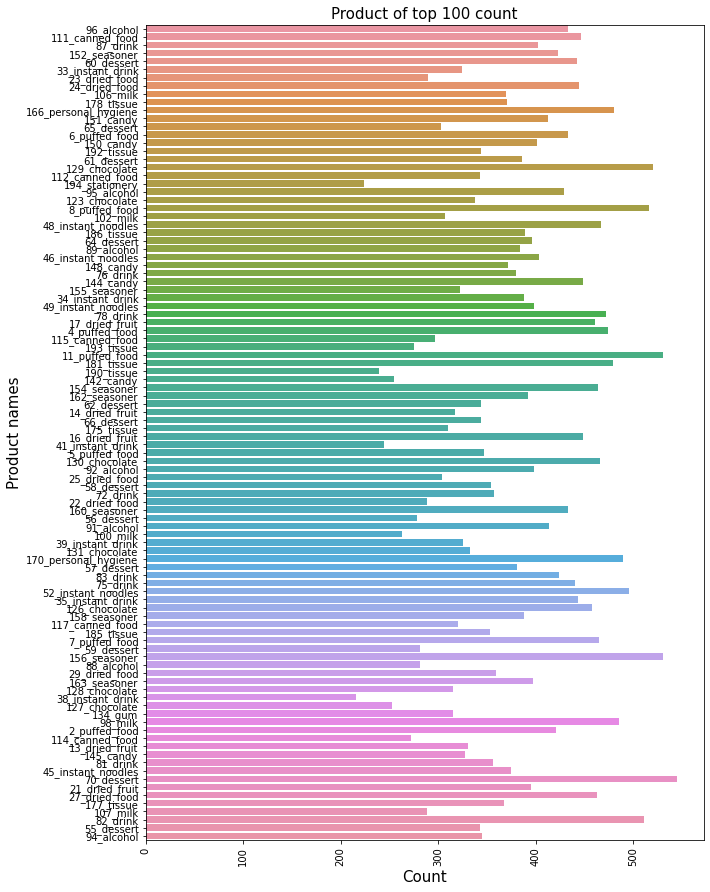

In [ ]:
f, ax = plt.subplots(figsize=(10, 15))
plt.xticks(rotation='90')
sns.barplot(y=data_1.index[:100], x=data_1['values'][:100])
plt.xlabel('Count', fontsize=15)
plt.ylabel('Product names', fontsize=15)
plt.title('Product of top 100 count', fontsize=15)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


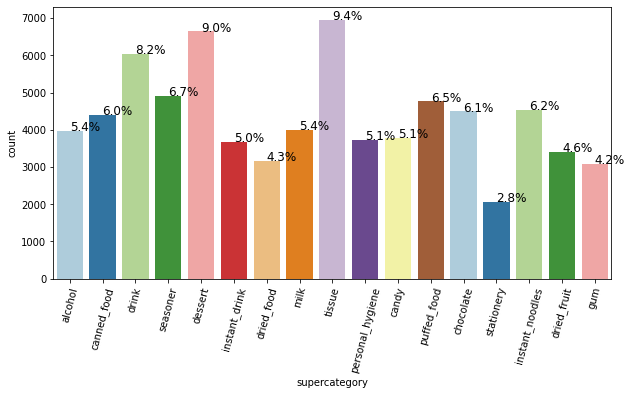

In [82]:
import seaborn as sns
plt.figure(figsize=(10,5))
total = len(valid['supercategory'])
ax = sns.countplot(valid['supercategory'],palette='Paired')
for p in ax.patches:
      percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
      x = p.get_x() + p.get_width() / 2  # width of the plot
      y = p.get_y() + p.get_height()  
      ax.annotate(percentage, (x, y), size = 12)
plt.xticks(rotation=75)
# Show the plot
plt.show()

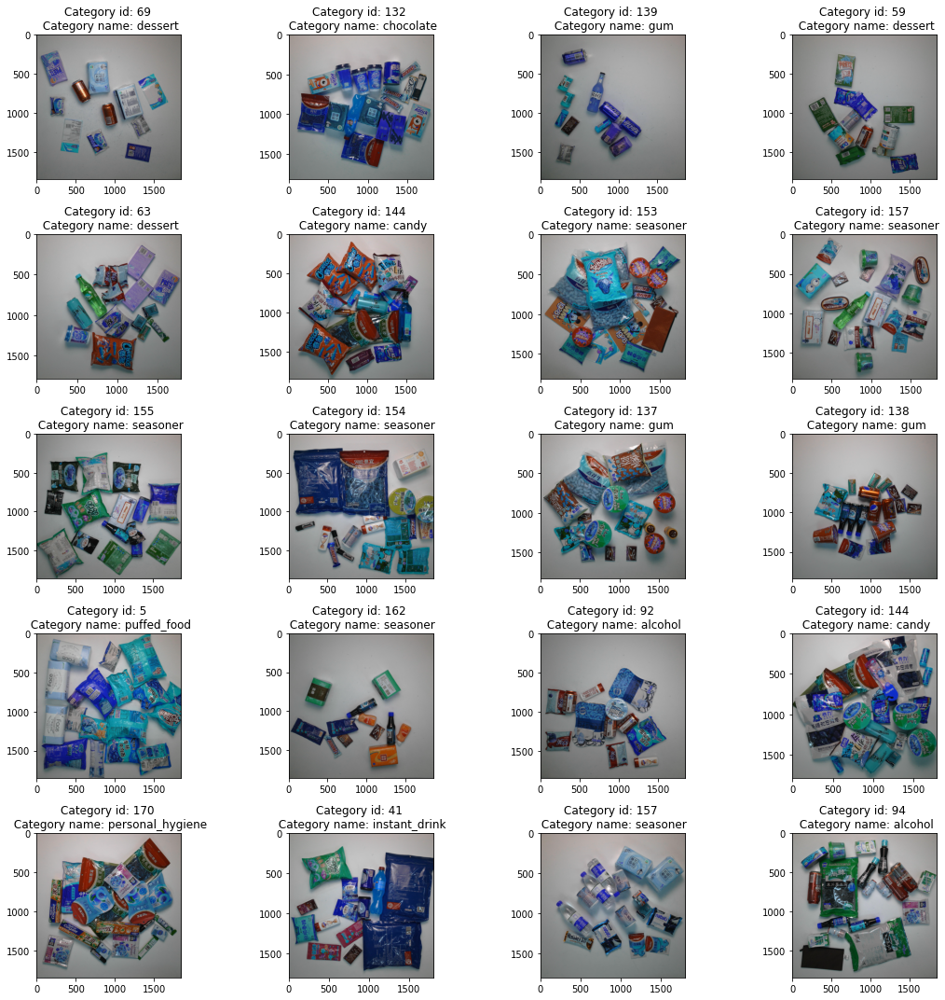

In [85]:
INPUT_PATH='val'
fig,ax=plt.subplots(5,4)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (4):
        l=rn.randint(0,valid.shape[0])
        #print(INPUT_PATH+'/'+test.iloc[l]['file_name'])
        img = cv2.imread(INPUT_PATH+'/'+valid.iloc[l]['file_name'],cv2.IMREAD_COLOR)
        #img = cv2.resize(img, (224,224))
        ax[i,j].imshow(img)
        ax[i,j].set_title('Category id: {} \n Category name: {}'.format(str(valid.iloc[l]['category_id']),str(valid.iloc[l]['supercategory'])))
plt.tight_layout()

In [86]:
valid['level'].value_counts()

hard      34589
medium    24732
easy      14281
Name: level, dtype: int64

In [87]:
font = cv2.FONT_HERSHEY_PLAIN
def annotate_image(data, resize=True):
    #print(DATA_ROOT+data['file_name'][0])
    img = cv2.imread(INPUT_PATH+'/'+data.iloc[0]['file_name'],cv2.IMREAD_COLOR)
    class_numbers=data['name'].unique()
    colors = np.random.uniform(0, 255, size=(len(class_numbers),3))
    class_numbers= {class_numbers[i]: colors[i] for i in range(len(class_numbers))}
    count=0
    for i, a in data.iterrows():
        label=data.loc[i]['name']
        xmin, ymin, width, height = a.bbox
        xmax, ymax = xmin + width, ymin + height
        xpoint, ypoint = a.point_xy
        xpoint, ypoint = int(xpoint), int(ypoint)
        color=class_numbers[label]
        #print(colour_box_current)
        cv2.rectangle(img, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color, 2)
        cv2.putText(img, label, (int(xmax), int(ymin)+25),  font, 3, (255,0,255), 2)
    if not resize:
        return img

    return img

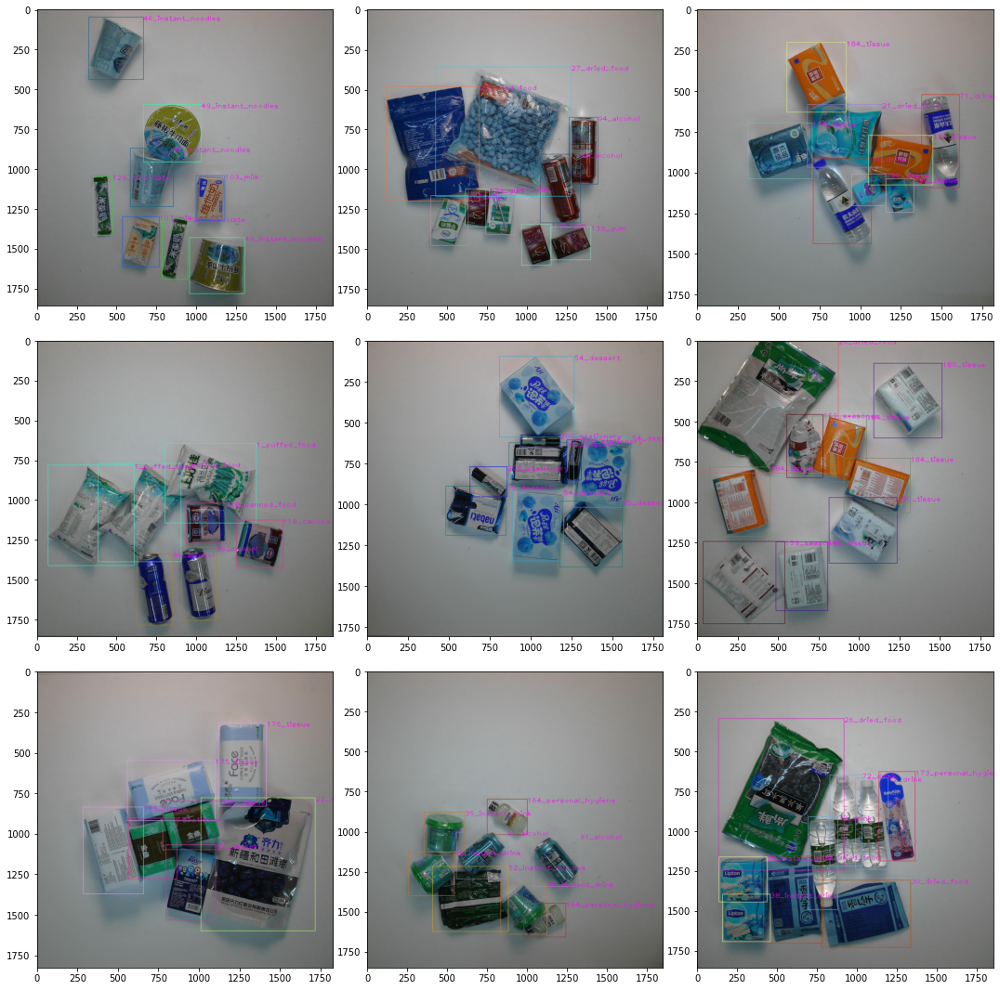

In [89]:
import random as rn
import cv2
INPUT_PATH='val'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
valid_easy=valid[valid['level']=='easy']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,valid_easy.shape[0])
        file_name=valid_easy.iloc[l]['file_name']
        #print(file_name)
        data=valid_easy[valid_easy['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

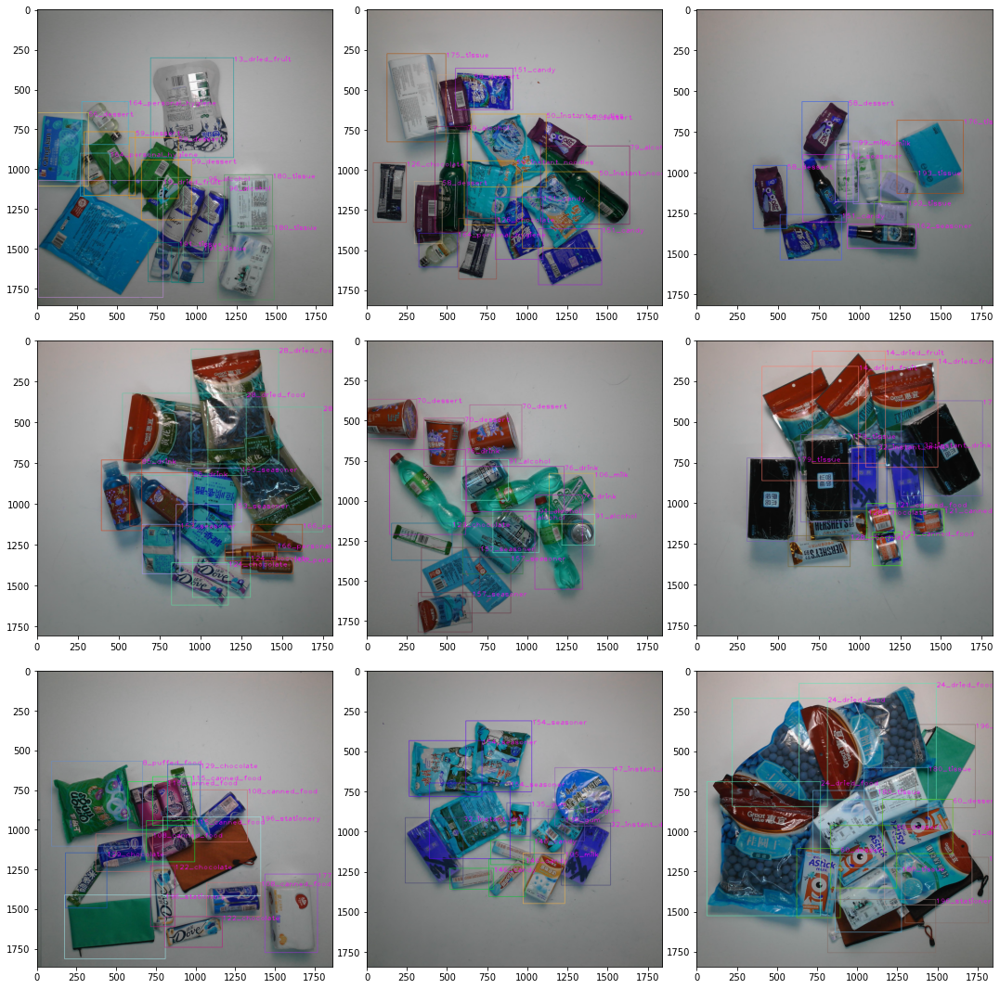

In [90]:
import random as rn
import cv2
INPUT_PATH='val/'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
valid_medium=valid[valid['level']=='medium']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,valid_medium.shape[0])
        file_name=valid_medium.iloc[l]['file_name']
        #print(file_name)
        data=valid_medium[valid_medium['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

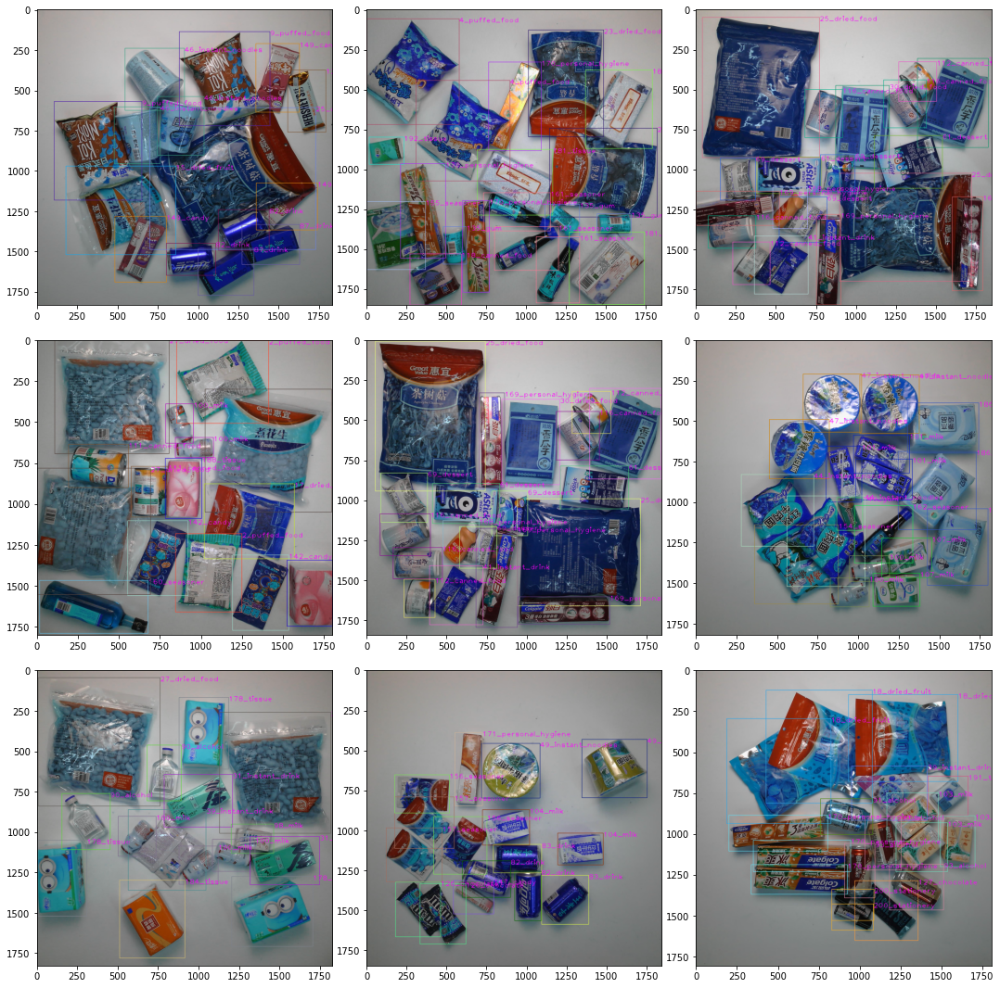

In [91]:
import random as rn
import cv2
INPUT_PATH='val'
fig,ax=plt.subplots(3,3)
fig.set_size_inches(15,15)
l=0
valid_hard=valid[valid['level']=='hard']
#plt.title('Bounding box of images with level=="Hard"')
for i in range(3):
    for j in range (3):
        l=rn.randint(0,valid_hard.shape[0])
        file_name=valid_hard.iloc[l]['file_name']
        #print(file_name)
        data=valid_hard[valid_hard['file_name'] == file_name]
        #print(data.shape)
        img_cv2 = annotate_image(data, False)
        ax[i,j].imshow(img_cv2)
#plt.subtitle('Bounding box of images with level=="Hard"')
plt.tight_layout()

In [92]:
import pickle
import joblib
valid=valid[['file_name','width','height','bbox','name']]
joblib.dump(valid, 'valid.pickle')

['valid.pickle']